<a href="https://colab.research.google.com/github/yirlenarias/TFG_PD/blob/main/Datos/Observado/Lluvia/Lluvia_Observada_20230507.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Climatología de Lluvia Observada

* Para trabajar más cómodamente vamos a descargar todos los ficheros del repositorio GitHub
* De esa manera dispondremos de los datos localmente para nuestro análisis.

In [ ]:
# Directorio de trabajo local en la nube de Google Colab 
# ------------------------------------------------------------
%cd /content

# Si existe una copia previa del repositorio, la borramos:
# ----------------------------------------------------------------------------
!  rm -rf TFG_PD

# Creamos una copia del repositorio SOLO si no existe previamente
# ----------------------------------------------------------------------------
! [ ! -d TFG_PD ] && git clone https://github.com/yirlenarias/TFG_PD.git

# Entramos en el repositorio que acabamos de copiar
# --------------------------------------------------
%cd TFG_PD/Datos/Observado/Lluvia

## Importar librerias

In [ ]:
import glob
import pandas as pd
import seaborn as sns
import os
import zipfile
import matplotlib.pyplot as plt
import numpy as np
import copy

## Abrir todos los archivos excel por cuenca

In [ ]:
# Criterios de coincidencia de patrones para archivos de Excel en el directorio
filenames = 'Cuenca*.xlsx'

In [ ]:
# Crea un diccionario vacío para almacenar los datos de cada archivo
dat = {}

# Recorra cada archivo de Excel que coincida con el patrón y lea sus datos en un marco de datos de pandas
for file in sorted(glob.glob(filenames)):
    dat[file] = pd.read_excel(file)

In [ ]:
# Access the data from each file using its file name as the key in the data_dict
data_new = []

for file, data in dat.items():
    data_new.append(data)

## Arreglar datos

* En la columna 'ESTACION' todos los valores tengan 3 digitos

In [ ]:
for i, df in enumerate(data_new):
    def formatear_valor(valor):
        if valor < 10:
            return '00' + str(valor)
        elif valor < 100:
            return '0' + str(valor)
        else:
            return str(valor)

    # Aplicar la función a la tabla
    data_new[i]['ESTACION'] = data_new[i]['ESTACION'].apply(formatear_valor)

In [ ]:
#Unir el numero de 'CUENCA' con 'ESTACION' para tener el numero de cada estacion
for i, df in enumerate(data_new):
    data_new[i]['ESTACION_NEW'] = data_new[i]['CUENCA'].astype(str) + data_new[i]['ESTACION'].astype(str)

In [ ]:
#Eliminar las columnas que no son necesarias
for i, df in enumerate(data_new):
    data_new[i].pop('CUENCA')
    data_new[i].pop('ESTACION')

## Agrupar datos por estación

* Agrupar las filas según los valores de la columna "ESTACION_NEW"

In [ ]:
my_list = list(range(0, 22))
porestacion=[]
for i in my_list:
    grupos = data_new[i].groupby('ESTACION_NEW')

    # Crear una tabla separada para cada grupo segun 'ESTACION_NEW'
    for ESTACION, grupo in grupos:
        # Obtener el DataFrame correspondiente a cada grupo
        tabla = grupos.get_group(ESTACION)
        porestacion.append(tabla) #Adjuntar los valores

* Obtener el número de cada estación

In [ ]:
NUMERO = copy.deepcopy(porestacion)
for i, df in enumerate(NUMERO):
    NUMERO[i] = NUMERO[i].iloc[0,2]

* Eliminar la columna 'ESTACION_NEW'

In [ ]:
#Eliminar las columnas que no se necesitan
for i, df in enumerate(porestacion):
    porestacion[i].pop('ESTACION_NEW')

* Ordenar valores a partir de la columna 'LLUVIA_DIARIA'

In [ ]:
# Recorrer la lista porestacion y ordenar cada tabla por 'fecha'
# Crear la nueva lista vacía
porestacion_ordenada = []

# Iterar a través de las tablas en la lista original
for df in porestacion:
    # Ordenar la tabla por la columna deseada
    df_ordenado = df.sort_values('LLUVIA_DIARIA', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    porestacion_ordenada.append(df_ordenado)

* Eliminar las filas con 0 o valores negativos

In [ ]:
# Crear una lista vacía para almacenar los valores eliminados
porestacion_eliminados = []

# Iterar a través de la lista de DataFrames y eliminar las filas donde 'LLUVIA_DIARIA' es 0
for i, df in enumerate(porestacion_ordenada):
    eliminados = df.loc[df['LLUVIA_DIARIA'] == 0]
    porestacion_ordenada[i] = df.loc[df['LLUVIA_DIARIA'] != 0] #Eliminar de cada tabla los valores 0
    porestacion_eliminados.append(eliminados)

## Obtener Boxplot

C:\Users\arias\AppData\Local\Temp\ipykernel_123292\1379091065.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


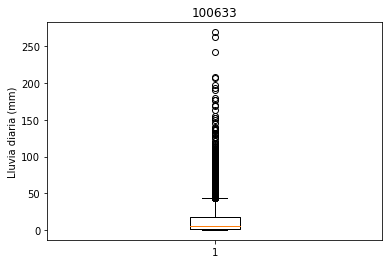

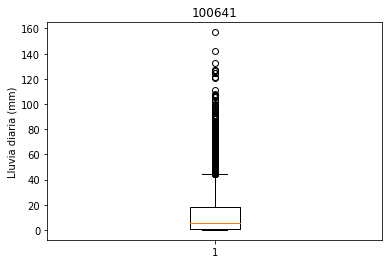

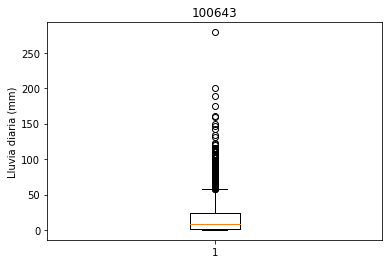

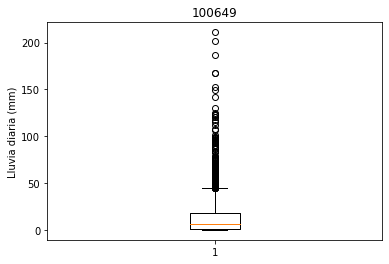

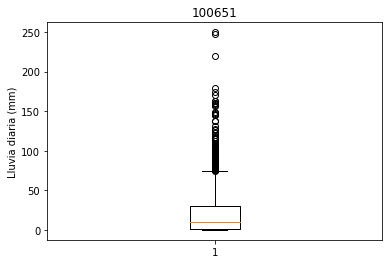

...

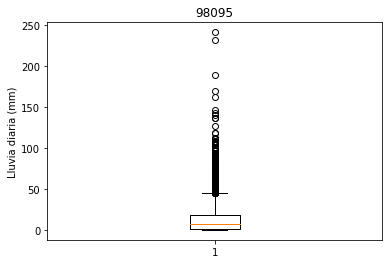

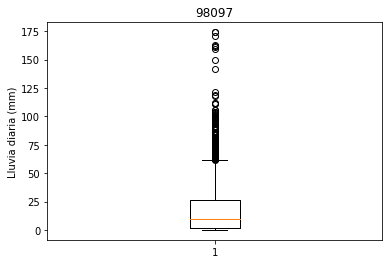

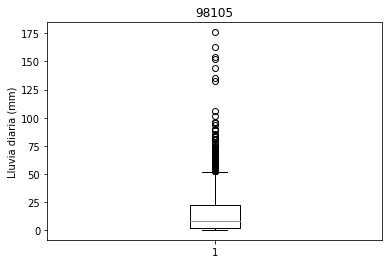

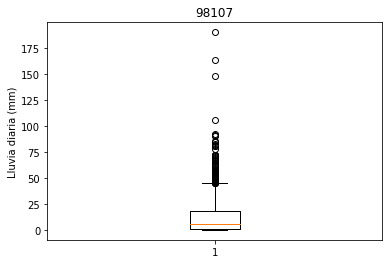

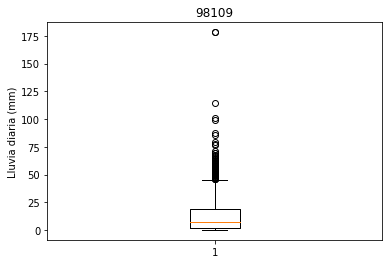

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# filtrar los valores atípicos (outliers) de un conjunto de datos que se encuentran fuera del rango intercuartílico (IQR)
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < Q1 - 1.5 * IQR) | (df[column] > Q3 + 1.5 * IQR)][column]
    return Q1, Q3, outliers

# Crear el archivo Excel
writer = pd.ExcelWriter('C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Lluvia/Boxplot/boxplot_data_lluvia.xlsx', engine='xlsxwriter')

# Iterar a través de las tablas y nombres de estaciones
for i in range(len(porestacion_ordenada)):
    # Obtener la tabla y el nombre de la estación
    df = porestacion_ordenada[i]
    estacion = NUMERO[i]
    
    # Crear el boxplot
    plt.figure()
    plt.boxplot(df['LLUVIA_DIARIA'])
    plt.title(estacion)
    plt.ylabel('Lluvia diaria (mm)')
    
    # Guardar los valores atipicos en una hoja de Excel, y utilizar la funcion 'detect_outliers'
    Q1, Q3, outliers = detect_outliers(df, 'LLUVIA_DIARIA')
    outliers_df = df.loc[df['LLUVIA_DIARIA'].isin(outliers)][['FECHA', 'LLUVIA_DIARIA']]
    outliers_df['Q1'] = Q1
    outliers_df['Q3'] = Q3
    outliers_df.to_excel(writer, sheet_name=estacion, index=False)

    #Guardar los boxplot
    nombre_archivo = 'C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Lluvia/Boxplot/boxplots_one/boxplot_lluvia_{}.png'.format(estacion)
    plt.savefig(nombre_archivo, dpi=300)
    
# Guardar el archivo Excel
writer.save()

In [ ]:
pd.set_option('display.max_rows', None)
df = porestacion_ordenada[10].sort_values(by='FECHA')
len(df)

4942

## Campana de Gauss

* Graficar la campana de gauss

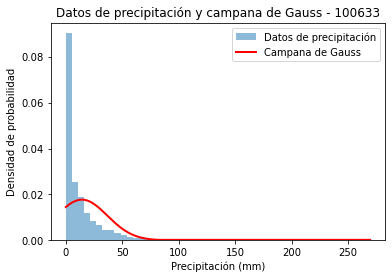

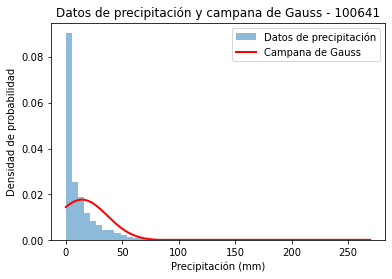

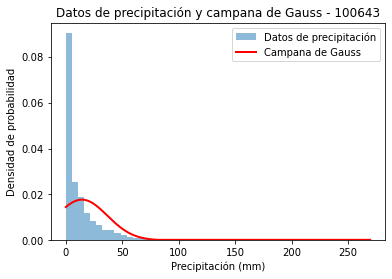

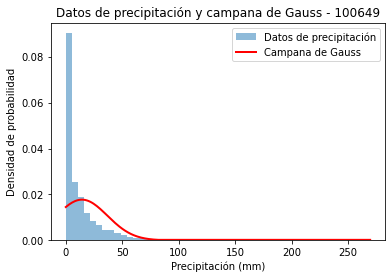

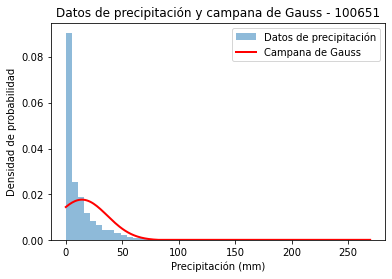

...

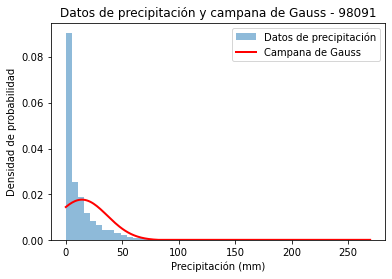

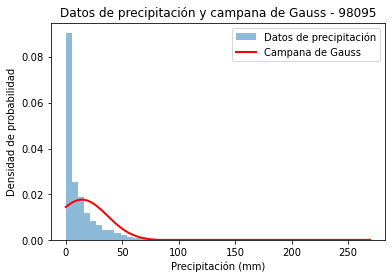

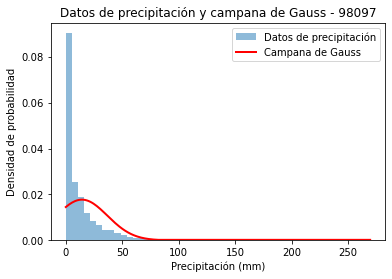

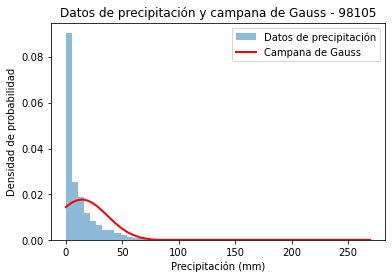

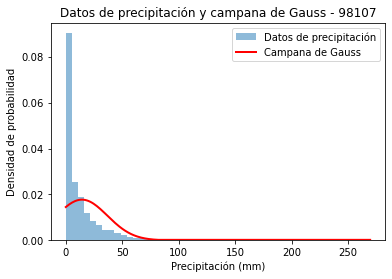

C:\Users\arias\AppData\Local\Temp\ipykernel_123292\182838967.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla['GAUSS'] = np.interp(tabla['LLUVIA_DIARIA'], x, y)


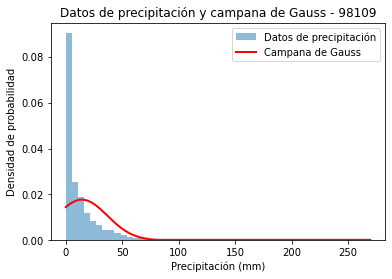

In [ ]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
porestacion_gauss = []
for name,tabla in zip(NUMERO,porestacion_ordenada):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['LLUVIA_DIARIA'].mean()
    sigma = tabla['LLUVIA_DIARIA'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['LLUVIA_DIARIA'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    porestacion_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = porestacion_gauss[0]
    plt.hist(tabla['LLUVIA_DIARIA'], bins=50, density=True, alpha=0.5, label='Datos de precipitación')
    plt.plot(tabla['LLUVIA_DIARIA'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Precipitación (mm)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de precipitación y campana de Gauss - {name}')
    plt.legend()
    plt.show()

## Percentiles 25 y 75

* Obtener los percentiles de cada tabla

In [ ]:
import numpy as np

percentiles_25 = []
percentiles_75 = []

for tabla in porestacion_ordenada:
    lluvia_diaria = tabla['LLUVIA_DIARIA']
    percentiles_25.append(np.percentile(lluvia_diaria, 25))
    percentiles_75.append(np.percentile(lluvia_diaria, 75))

* Convertir en NaN todos los valores anomalos

In [ ]:
IQR = np.array(percentiles_75) - np.array(percentiles_25)
for i, tabla in enumerate(porestacion_ordenada):
    lluvia_diaria = tabla['LLUVIA_DIARIA']
    tabla['LLUVIA_DIARIA'] = np.where((lluvia_diaria < (percentiles_25[i] - 1.5 * IQR[i])) | (lluvia_diaria > (percentiles_75[i] + 1.5 * IQR[i])), np.nan, lluvia_diaria)

* Gauss - SOLO ES UNA PRUEBA

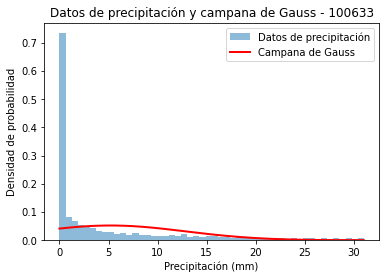

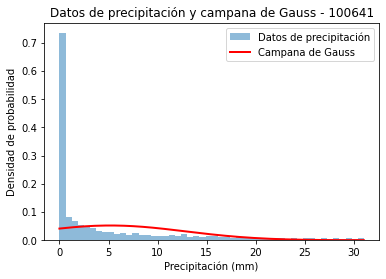

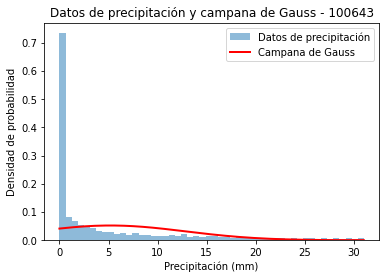

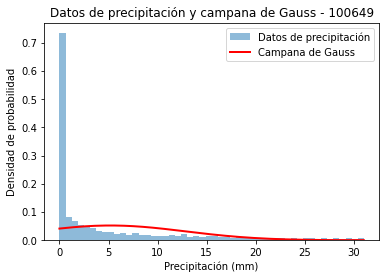

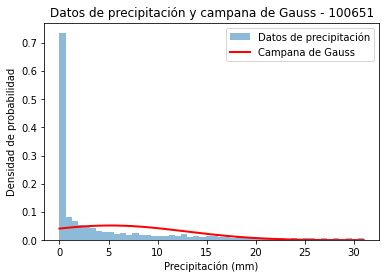

...

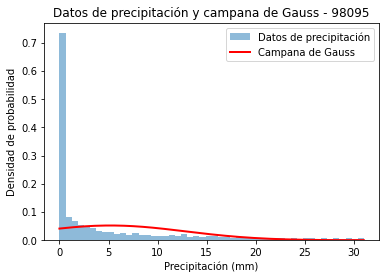

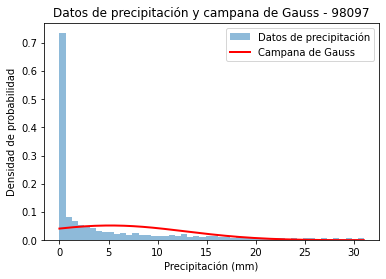

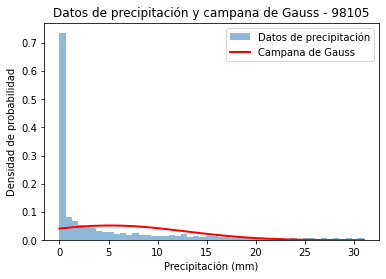

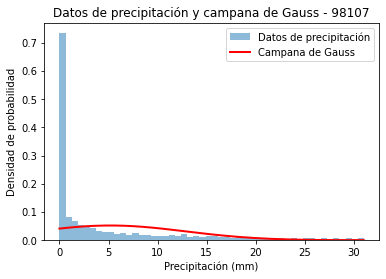

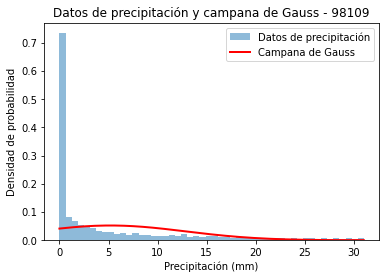

In [ ]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
porestacion_gauss = []
for name,tabla in zip(NUMERO,porestacion_ordenada):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['LLUVIA_DIARIA'].mean()
    sigma = tabla['LLUVIA_DIARIA'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['LLUVIA_DIARIA'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    porestacion_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = porestacion_gauss[0]
    plt.hist(tabla['LLUVIA_DIARIA'], bins=50, density=True, alpha=0.5, label='Datos de precipitación')
    plt.plot(tabla['LLUVIA_DIARIA'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Precipitación (mm)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de precipitación y campana de Gauss - {name}')
    plt.legend()
    plt.show()

## Unir datos

* Concatenar las filas eliminadas que contienen 0mm de lluvia con los nuevos datos
* Luego de aplicado control de calidad

In [ ]:
# Suponiendo que porestacion_ordenada y porestacion_eliminados son listas de DataFrames
# Suponiendo que tienen la misma longitud
porestacion_total = []
for i in range(len(porestacion_ordenada)):
    tabla_concatenada = pd.concat([porestacion_ordenada[i], porestacion_eliminados[i]])
    porestacion_total.append(tabla_concatenada)

* Odenar los datos por fecha

In [ ]:
# Crear la nueva lista vacía
EST_TOT = []

# Iterar a través de las tablas en la lista original
for df in porestacion_ordenada:
    # Ordenar la tabla por la columna deseada (en este ejemplo, 'LLUVIA_DIARIA')
    df_ordenado = df.sort_values('FECHA', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    EST_TOT.append(df_ordenado)
    
EST_TOT

[          FECHA  LLUVIA_DIARIA     GAUSS
 1    2004-02-13           1.78  0.015162
 2    2004-02-14           0.51  0.014668
 8    2004-02-20           9.91  0.017384
 9    2004-02-21           5.59  0.016434
 11   2004-02-23           7.37  0.016891
 ...         ...            ...       ...
 6508 2022-12-27           7.00  0.016807
 6509 2022-12-28           2.20  0.015318
 6510 2022-12-29          27.20  0.015067
 6511 2022-12-30           2.00  0.015244
 6512 2022-12-31           7.60  0.016943
 
 [4741 rows x 3 columns],
            FECHA  LLUVIA_DIARIA     GAUSS
 6513  2007-03-09            0.9  0.016708
 6514  2007-03-10            1.9  0.017272
 6515  2007-03-11            8.5  0.020093
 6516  2007-03-12           12.5  0.020778
 6520  2007-03-16           11.4  0.020676
 ...          ...            ...       ...
 11975 2022-12-26            1.6  0.017108
 11976 2022-12-27            0.8  0.016650
 11977 2022-12-28           11.6  0.020702
 11978 2022-12-29           15.6  0.02

## Obtener fecha inicial y final de cada estación

* Volver la columna 'FECHA' un dateintex

In [ ]:
for i, df in enumerate(EST_TOT):
    EST_TOT[i] = EST_TOT[i].set_index('FECHA')

* Encontrar los valores de inicio y final de las fechas

In [ ]:
my_list = list(range(0, 154))
porestacion_date=[]
for i in my_list:
    fecha_inicial = EST_TOT[i].index.min()
    fecha_final = EST_TOT[i].index.max()
    name = NUMERO[i]
    porestacion_date.append((fecha_inicial,fecha_final, name))

* Guardar el rango de fechas en un archivo .txt

In [ ]:
# Abrir el archivo en modo escritura
with open("rango_fechas.txt", "w") as archivo:
    # Escribir la lista en el archivo
    for valor in porestacion_date:
        archivo.write(str(valor) + "\n")

## Obtener los estadisticos

* Eliminar los valores Nan

In [ ]:
for i, df in enumerate(EST_TOT):
    EST_TOT[i] = EST_TOT[i].dropna(subset=['LLUVIA_DIARIA'])

* (media, mediana, máximo y mínimo)

In [ ]:
#Obtener el promedio diario
porestacion_mean = []
porestacion_median = []
porestacion_max = []
porestacion_min = []
for i, df in enumerate(porestacion):
    media = EST_TOT[i].groupby(EST_TOT[i].index.strftime("%m%d")).mean()
    mediana = EST_TOT[i].groupby(EST_TOT[i].index.strftime("%m%d")).median()
    maximo = EST_TOT[i].groupby(EST_TOT[i].index.strftime("%m%d")).max()
    minimo = EST_TOT[i].groupby(EST_TOT[i].index.strftime("%m%d")).min()
    #groupby() se usa agrupando por mes y por día a la vez
    porestacion_mean.append(media)
    porestacion_median.append(mediana)
    porestacion_max.append(maximo)
    porestacion_min.append(minimo)

In [ ]:
# Recorrer la lista porestacion y ordenar cada tabla por fecha
# Crear la nueva lista vacía
mean_new = []

# Iterar a través de las tablas en la lista original
for df in porestacion_mean:
    # Ordenar la tabla por la columna deseada (en este ejemplo, 'LLUVIA_DIARIA')
    df_ordenado = df.sort_values('LLUVIA_DIARIA', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    mean_new.append(df_ordenado)
    
mean_new

[       LLUVIA_DIARIA     GAUSS
 FECHA                         
 0226        1.200000  0.010343
 0219        1.260000  0.010948
 0302        1.800000  0.018096
 0227        1.800000  0.018096
 0212        1.945000  0.020523
 ...              ...       ...
 0113       13.200000  0.004897
 0116       13.225000  0.004764
 0103       13.350000  0.004138
 0417       13.833333  0.002341
 0201       18.000000  0.001853
 
 [359 rows x 2 columns],
        LLUVIA_DIARIA     GAUSS
 FECHA                         
 0223        1.100000  0.011384
 0310        1.400000  0.015113
 0117        1.600000  0.018092
 0203        1.600000  0.018092
 0324        1.700000  0.019747
 ...              ...       ...
 1006       12.700000  0.006676
 0106       12.900000  0.005377
 0523       14.766667  0.001856
 0109       15.200000  0.001856
 0213       16.400000  0.001856
 
 [364 rows x 2 columns],
        LLUVIA_DIARIA     GAUSS
 FECHA                         
 0207        1.800000  0.008249
 0628        1.800

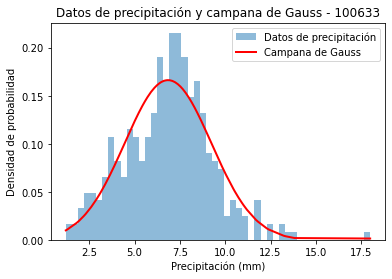

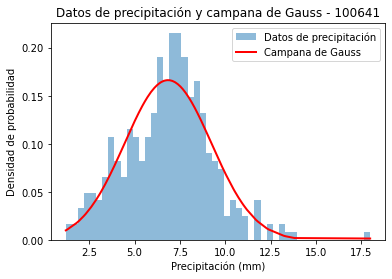

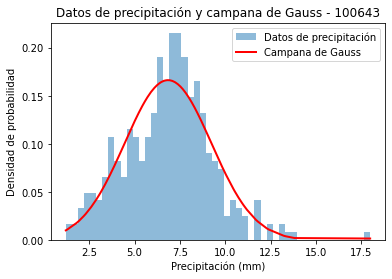

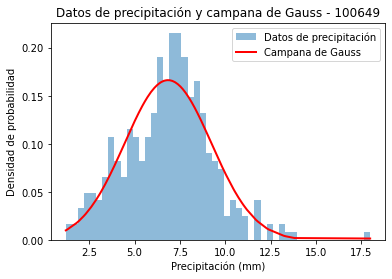

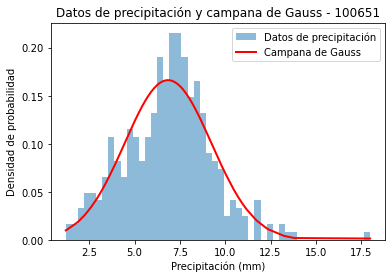

...

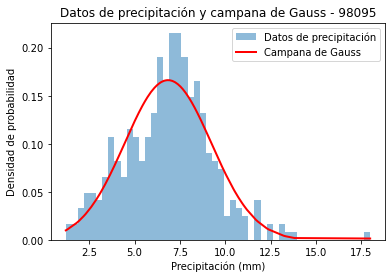

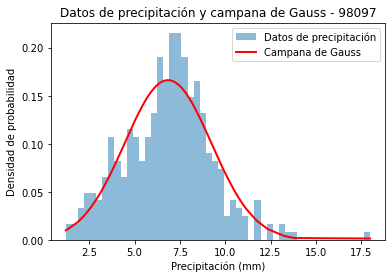

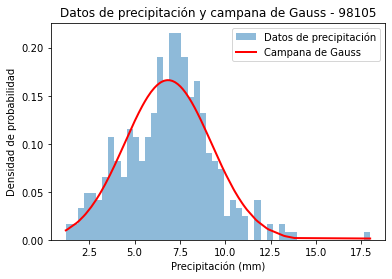

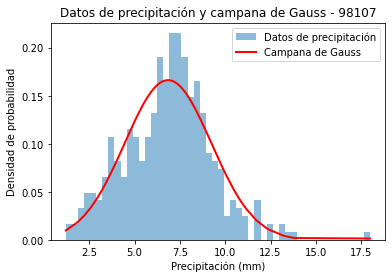

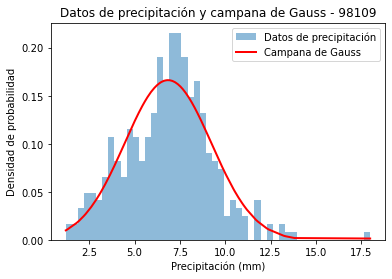

In [ ]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
porestacion_gauss = []
for name,tabla in zip(NUMERO,mean_new):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['LLUVIA_DIARIA'].mean()
    sigma = tabla['LLUVIA_DIARIA'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['LLUVIA_DIARIA'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    porestacion_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = porestacion_gauss[0]
    plt.hist(tabla['LLUVIA_DIARIA'], bins=50, density=True, alpha=0.5, label='Datos de precipitación')
    plt.plot(tabla['LLUVIA_DIARIA'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Precipitación (mm)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de precipitación y campana de Gauss - {name}')
    plt.legend()
    plt.show()

* Crear una lista con los estadisticos

In [ ]:
#Crear una lista vacía llamada lista_de_listas_de_tablas
lista_de_listas_de_tablas = []

# Agregar las dos listas de tablas a la lista_de_listas_de_tablas
lista_de_listas_de_tablas.append(porestacion_mean)
lista_de_listas_de_tablas.append(porestacion_median)
lista_de_listas_de_tablas.append(porestacion_max)
lista_de_listas_de_tablas.append(porestacion_min)

* Seleccionar solo la columna que interesa

In [ ]:
# Lista de listas de las columnas seleccionadas
lista_de_columnas_seleccionadas = []

# Iterar a través de cada lista de tablas en lista_de_listas_de_tablas
for lista in lista_de_listas_de_tablas:
    # Crear una lista para almacenar las columnas de 'Nombre' de cada tabla en la lista actual
    columnas_de_nombre = []
    # Iterar a través de cada DataFrame en la lista actual
    for tabla in lista:
        # Seleccionar la columna 'Nombre' de cada tabla y agregarla a la lista de columnas
        columna = tabla['LLUVIA_DIARIA']
        columnas_de_nombre.append(columna)
    # Agregar la lista de columnas de 'Nombre' de la lista actual a la lista de columnas seleccionadas
    lista_de_columnas_seleccionadas.append(columnas_de_nombre)

* Convertir en dataframe cada lista de estaciones

In [ ]:
# Lista de DataFrames individuales
lista_de_dataframes = []

# Iterar sobre cada lista y convertirla en un DataFrame individual
for lista in lista_de_columnas_seleccionadas:
    df = pd.DataFrame(lista)
    lista_de_dataframes.append(df)

* Transponer cada dataframe de estaciones

In [ ]:
# Lista de DataFrames transpuestos
lista_de_dataframes_transpuestos = []

# Iterar sobre cada DataFrame y transponerlo
for df in lista_de_dataframes:
    df_transpuesto = df.transpose()
    lista_de_dataframes_transpuestos.append(df_transpuesto)

* Renombrar las columnas

In [ ]:
# Cambiar los nombres de las columnas en cada DataFrame
for df in lista_de_dataframes_transpuestos:
    df.columns = NUMERO

In [ ]:
lista_de_dataframes_transpuestos[0]

,100633,100641,100643,100649,100651,100653,100655,200002,200007,200009,...,94019,96003,98075,98087,98091,98095,98097,98105,98107,98109
FECHA,,,,,,,,,,,,,,,,,,,,,
0101,0.600000,1.400000,4.475000,2.555556,3.366667,0.762500,0.266667,4.173333,0.514286,3.075000,...,0.000000,2.800000,0.000000,1.518750,0.807692,1.120000,4.725000,0.000000,0.000000,2.150000
0102,0.828571,1.866667,2.812500,3.075000,0.000000,1.283333,3.533333,4.266000,0.000000,7.350000,...,6.400000,0.971429,0.266667,0.164706,1.033333,1.471429,5.609091,0.000000,1.800000,6.250000
0103,2.670000,1.600000,2.475000,2.825000,1.714286,1.088889,2.000000,10.502500,1.065000,7.100000,...,1.066667,5.175000,2.023529,1.993333,0.542857,3.821429,2.542857,1.866667,4.233333,6.300000
0104,0.485714,4.354545,2.342857,0.000000,3.514286,0.533333,4.633333,7.282500,0.000000,11.920000,...,0.000000,3.814286,0.981250,2.037500,1.035000,2.121429,4.850000,1.950000,1.100000,2.640000
0105,1.169231,2.570000,4.037500,0.000000,1.840000,1.114286,1.466667,5.022500,0.325000,6.600000,...,0.000000,0.583333,0.900000,0.943750,1.313333,0.666667,5.166667,0.000000,0.866667,0.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227,4.853077,1.075000,3.580000,0.000000,7.857143,1.650000,0.000000,4.368333,0.168333,4.875000,...,0.575000,3.328571,1.533333,0.000000,0.520000,1.121429,4.518182,0.000000,2.533333,2.375000
1228,2.716667,1.570000,5.962500,1.471429,0.533333,1.050000,0.542857,2.490000,0.685714,1.350000,...,0.400000,0.820000,2.041667,1.125000,1.706667,0.821429,3.750000,0.712500,7.066667,5.700000
1229,0.620769,2.600000,2.037500,2.571429,3.150000,0.000000,4.857143,0.000000,2.566667,0.000000,...,0.733333,0.000000,0.608333,0.000000,1.280000,0.669231,2.155556,0.000000,4.500000,7.250000


## Guardar estadisticos en excel

In [ ]:
# Crear el objeto ExcelWriter
writer = pd.ExcelWriter('Climatologia_Diaria_Observada_Lluvia_20230429.xlsx', engine='xlsxwriter')

# Escribir los DataFrames en diferentes hojas
lista_de_dataframes_transpuestos[0].to_excel(writer, sheet_name='mean', index=True)
lista_de_dataframes_transpuestos[1].to_excel(writer, sheet_name='median', index=True)
lista_de_dataframes_transpuestos[2].to_excel(writer, sheet_name='max', index=True)
lista_de_dataframes_transpuestos[3].to_excel(writer, sheet_name='min', index=True)

# Guardar el archivo Excel
writer.save()

## Abrir lista de estaciones

In [ ]:
#Cargar la lista de estaciones (enviadas oor Keily) y que que contienen el rango de fechas que agregamos manualmente del .txt guardado a partir de las fechas de inicio y final
estaciones = pd.read_excel(r'/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observada/Lluvia/Lista de estaciones.xlsx')

In [ ]:
# Convertir las columnas de fecha a objetos datetime
estaciones['INICIO'] = pd.to_datetime(estaciones['INICIO'])
estaciones['FINAL'] = pd.to_datetime(estaciones['FINAL'])

In [ ]:
# Seleccionar filas con 10 o más años de diferencia entre A y B
df_10_anos = estaciones[(estaciones['FINAL'] - estaciones['INICIO']) >= pd.Timedelta('3650 days')]
df_10_anos

,NUMERO,NOMBRE,LATITUD NORTE,LONGITUD OESTE,ALTITUD (msnm),INICIO,FINAL,ESTACION
0,100633,FINCA EL PATIO. PUERTO JIMENEZ,"08º 36' 04.6""","83º25'52.2""",24,2004-02-12,2022-12-31,100633
1,100641,COOPEAGROPAL. LAUREL .,"08º 28' 17.6""","82º51'38.4""",38,2007-03-09,2022-12-31,100641
2,100643,RIO CLARO,"08º 40' 26.5""","83º03'43.2""",51,2009-12-11,2022-12-31,100643
7,200002,ISLA DEL COCO,"05º 33' 00""","87º03'00""",75,2002-01-01,2017-07-11,200002
8,200007,ISLA SAN JOSE,"10º 51' 15.40""","85º54'34.50""",44,2008-05-24,2019-08-15,200007
...,...,...,...,...,...,...,...,...
146,98075,LAS BRISAS. SABALITO,"08º 52' 38.3""","82º53'27.5""",1073,2002-01-01,2022-11-10,98075
147,98087,PINDECO,"09º 08' 49""","83º20'06""",397,2002-01-01,2022-12-31,98087
148,98091,CHIRRIPO,"09º 27' 30""","83º30'30""",3440,2002-01-01,2022-04-18,98091
149,98095,ALTAMIRA,"09º 01' 45.7""","83º00'28.7""",1370,2002-01-01,2022-12-31,98095


In [ ]:
# Calcular la cantidad de años en cada fila y encontrar la máxima
estaciones['diff'] = estaciones['FINAL'].dt.year - estaciones['INICIO'].dt.year
max_diff = estaciones['diff'].max()

# Seleccionar solo las filas que tienen la cantidad máxima de años
df_max_diff = estaciones[estaciones['diff'] == max_diff]